In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from pandas import read_csv

## Series de tiempo de capturas bcs

In [2]:
dt = read_csv('data.csv',  header=0, index_col=0)
#dt=dt[dt.Pesqueria!='OTROS']

In [3]:
DT = read_csv('BDPES/prom.csv',  header=0, index_col=0 , low_memory=False )
#DT=DT[DT.Pesqueria!='OTROS']

In [4]:
df = read_csv('BDPES/BDlista2018.csv', header=0, index_col=0,low_memory=False)
df=df[df.Pesqueria!='OTROS']
Encabezados=df.columns.values.tolist()
print(Encabezados)


['Entidad_federativa', 'Tipo_de_pesca', 'Year', 'Mes', 'Dia', 'Oficina', 'Latitud', 'Longitud', 'Folio', 'Duracion', 'Dias_Efectivos', 'Sitio_Desembarque_Clave', 'Sitio_Desembarque', 'Zona_Captura', 'Zona_Captura_Clave', 'Especie_Clave', 'Especie_nombre_general', 'Especie_nombre', 'Especie_nombre_cientifico', 'Presentacion', 'Class', 'Order', 'Family', 'Genus', 'Ganancia_total_Mxn', 'Peso_Kg', 'Precio_Mxn', 'Zona', 'Pesqueria', 'Region']


In [5]:
Pesqueria=df.Pesqueria.values.tolist()
c=pd.Series(Pesqueria,dtype="category")
acatp=c.cat.categories
pesquerias=pd.Series.tolist(acatp)

Anos=df.Year.values.tolist()
c=pd.Series(Anos,dtype="category")
acaty=c.cat.categories
year=pd.Series.tolist(acaty)



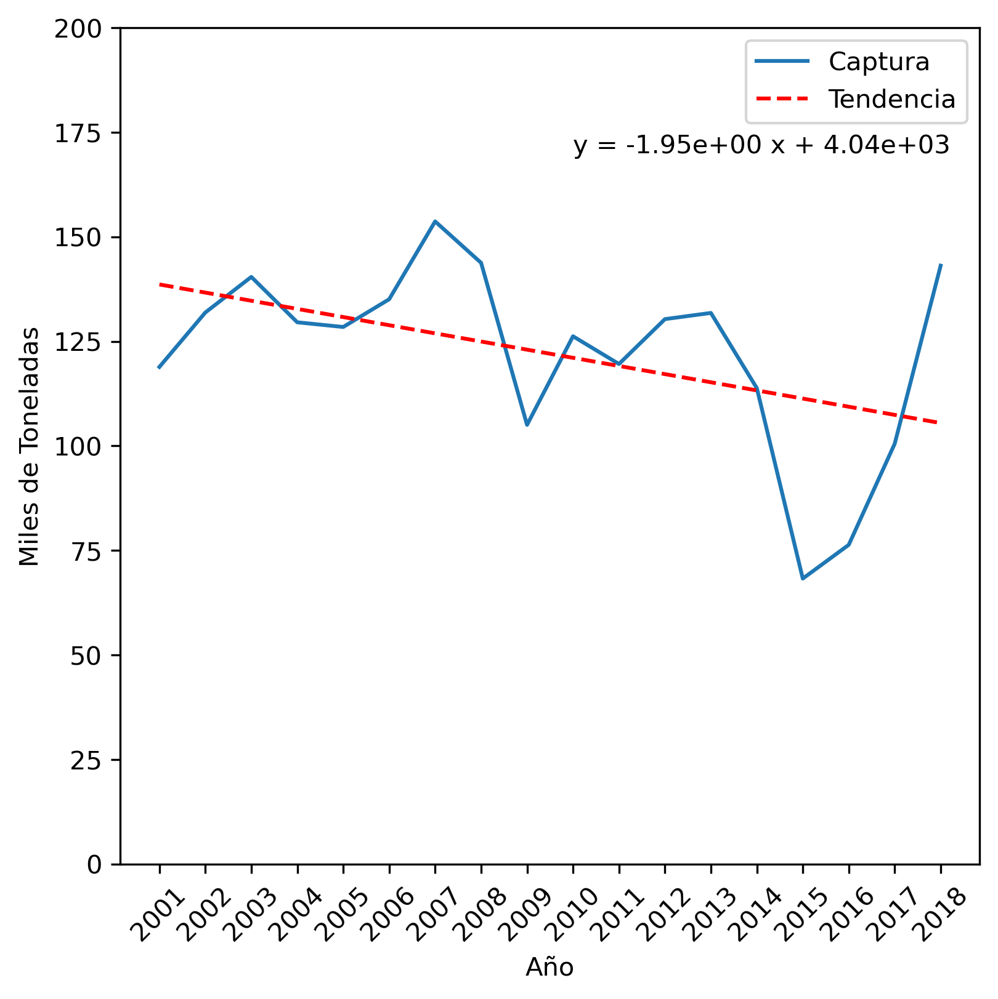

<Figure size 432x288 with 0 Axes>

In [6]:
X = pd.DataFrame(range(2001,2019))
X.columns = ['X']
z = np.polyfit(X['X'], DT['Peso_Kg']/1000000, 1)
p = np.poly1d(z)
m = '{:.2e}'.format(z[0])
b = '{:.2e}'.format(z[1])
fig = plt.figure(figsize=(6,6),dpi=300, facecolor='w', edgecolor='k')
plt.plot(DT['Peso_Kg']/1000000, label='Captura')
plt.plot(X['X'],p(X),"r--",label='Tendencia')
plt.ticklabel_format(style='plain')
plt.ylim([0,200])
plt.text(2010 ,170, 'y = {} x + {}'.format(m, b),fontsize=10)
plt.xticks(ticks=year, labels=None, rotation=45)
plt.xlabel('Año')
plt.ylabel('Miles de Toneladas')
plt.legend()
plt.show()
plt.tight_layout()
#fig.savefig('captura.png')

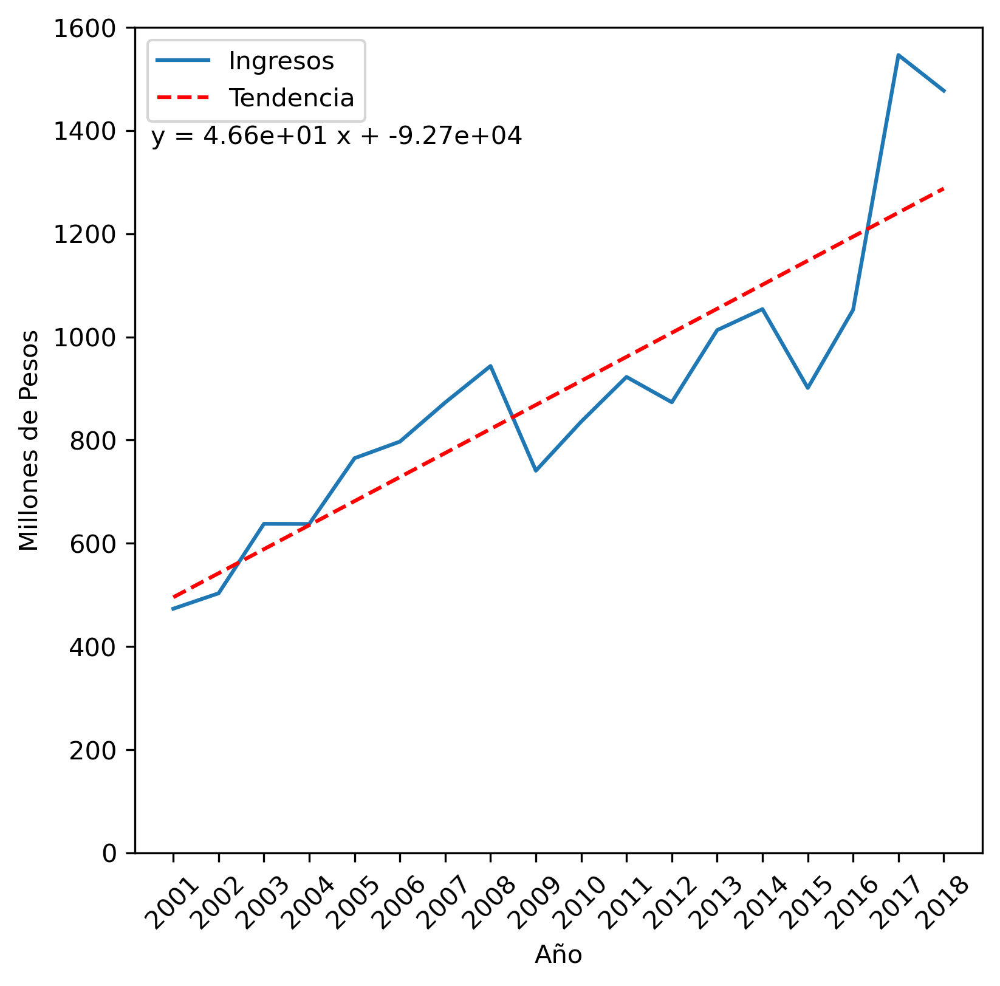

In [7]:
X = pd.DataFrame(range(2001,2019))
X.columns = ['X']
z = np.polyfit(X['X'], DT['Ganancia_total']/1000000, 1)
p = np.poly1d(z)
m = '{:.2e}'.format(z[0])
b = '{:.2e}'.format(z[1])

fig2 = plt.figure(figsize=(6,6),dpi=300, facecolor='w', edgecolor='k')
plt.plot(DT['Ganancia_total']/1000000, label='Ingresos')
plt.plot(X['X'],p(X),"r--",label='Tendencia')
plt.ticklabel_format(style='plain')
plt.ylim([0,1600])
plt.text(2000.5 ,1375, 'y = {} x + {}'.format(m, b),fontsize=10)
plt.xticks(ticks=year, labels=None, rotation=45)

plt.xlabel('Año')
plt.ylabel('Millones de Pesos')
plt.legend()
#plt.tight_layout()
plt.show()
fig.savefig('ingresos.png')

In [8]:

tabla1=df.groupby(['Year','Pesqueria'],as_index=False).sum().pivot('Year','Pesqueria').fillna(0)


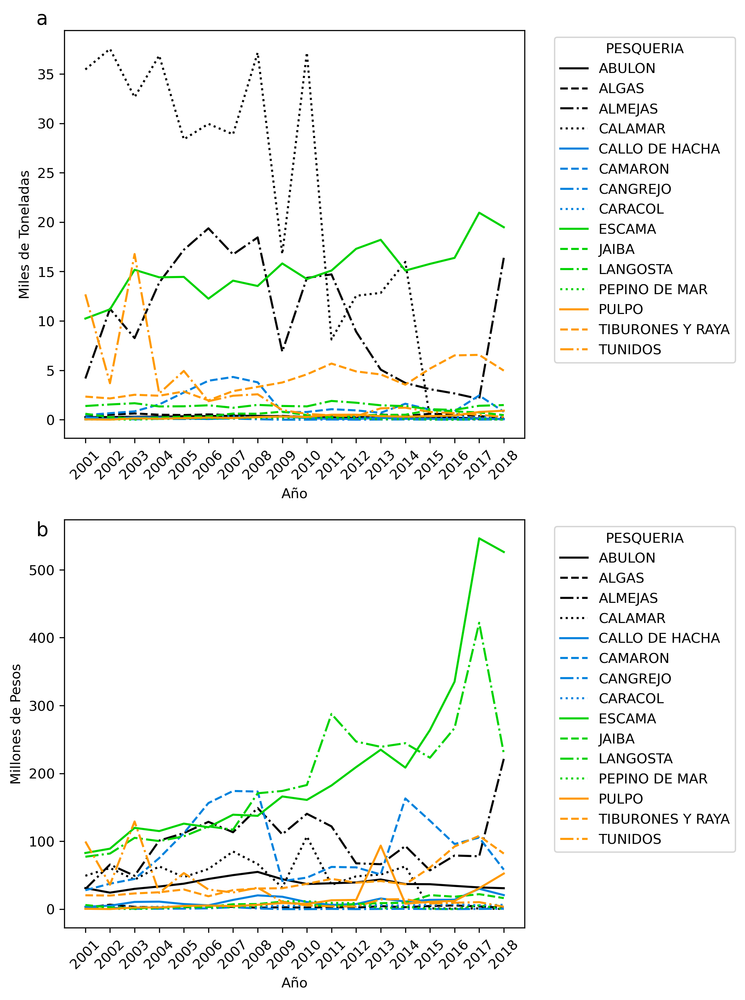

In [9]:

NUM_COLORS = len(pesquerias)
LINE_STYLES = ['solid', 'dashed', 'dashdot', 'dotted']
NUM_STYLES = len(LINE_STYLES)

cm = plt.get_cmap('nipy_spectral')
fig = plt.figure(figsize=(6,12),dpi=300, facecolor='w', edgecolor='k')
ax = fig.add_subplot(211)
for i in range(NUM_COLORS):
    lines = ax.plot(tabla1.Peso_Kg[pesquerias[i]]/1000000)
    lines[0].set_color(cm(i//NUM_STYLES*float(NUM_STYLES)/NUM_COLORS))
    lines[0].set_linestyle(LINE_STYLES[i%NUM_STYLES])
plt.legend(pesquerias, title='PESQUERIA', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.ticklabel_format(style='plain')
plt.xticks(ticks=year, labels=None, rotation=45)
plt.xlabel('Año')
plt.ylabel('Miles de Toneladas')
plt.text(1999,40, 'a',fontsize=14)

ax = fig.add_subplot(212)
for i in range(NUM_COLORS):
    lines = ax.plot(tabla1.Ganancia_total_Mxn[pesquerias[i]]/1000000)
    lines[0].set_color(cm(i//NUM_STYLES*float(NUM_STYLES)/NUM_COLORS))
    lines[0].set_linestyle(LINE_STYLES[i%NUM_STYLES])
plt.ticklabel_format(style='plain')
plt.legend(pesquerias, title='PESQUERIA', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.xticks(ticks=year, labels=None, rotation=45)
plt.xlabel('Año')
plt.ylabel('Millones de Pesos')
plt.text(1999,550, 'b',fontsize=14)

fig.savefig('moreColors.png')
plt.show()

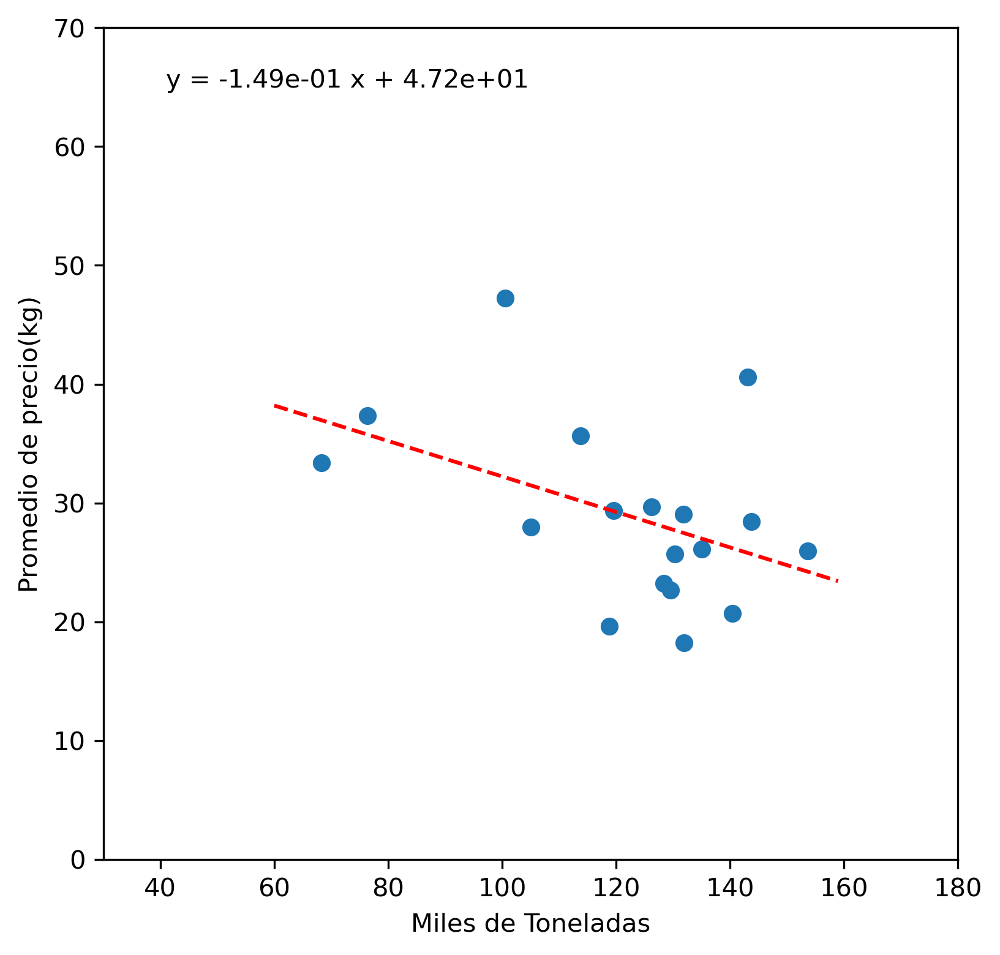

In [10]:
fig = plt.figure(figsize=(6,6),dpi=300, facecolor='w', edgecolor='k')
ax1 = fig.add_subplot(111)
X = pd.DataFrame(range(60,160))
X.columns = ['X']
z = np.polyfit(DT['Peso_Kg']/1000000,DT['Precio_Mxn'],  1)
p = np.poly1d(z)
m = '{:.2e}'.format(z[0])
b = '{:.2e}'.format(z[1])
ax1.plot(X['X'],p(X),"r--",label='Tendencia')
ax1.scatter(DT.Peso_Kg/1000000,DT.Precio_Mxn)
plt.text(41 ,65, 'y = {} x + {}'.format(m, b),fontsize=10)
plt.ylim([0,70])
plt.xlim([30,180])
plt.ylabel('Promedio de precio(kg)')
plt.xlabel('Miles de Toneladas')
plt.show()
#fig.savefig('correlacion.png')

In [11]:
dataset = read_csv('tablaiir.csv', header=0, index_col=0, low_memory=False)

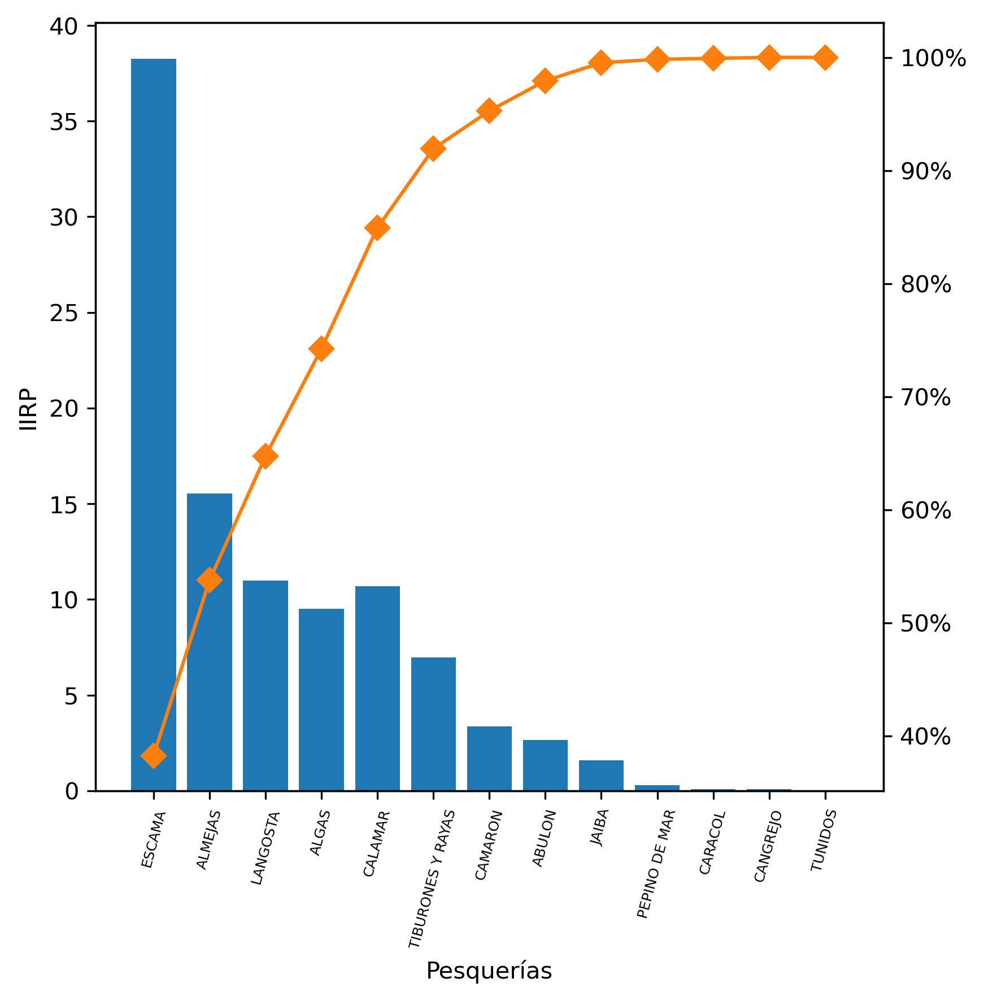

In [40]:
from matplotlib.ticker import PercentFormatter

fig = plt.figure(figsize=(6,6),dpi=300, facecolor='w', edgecolor='k')
ax = fig.add_subplot(111)
ax.bar(dataset.index, dataset['IIRP'], color="C0")
plt.xticks(rotation=75,fontsize=6)
plt.ylabel('IIRP')
plt.xlabel('Pesquerías')
ax2 = ax.twinx()
ax2.plot(dataset.index, dataset['CIIRP'], color="C1", marker="D", ms=7)
ax2.yaxis.set_major_formatter(PercentFormatter())

#fig.savefig('iirp.png')


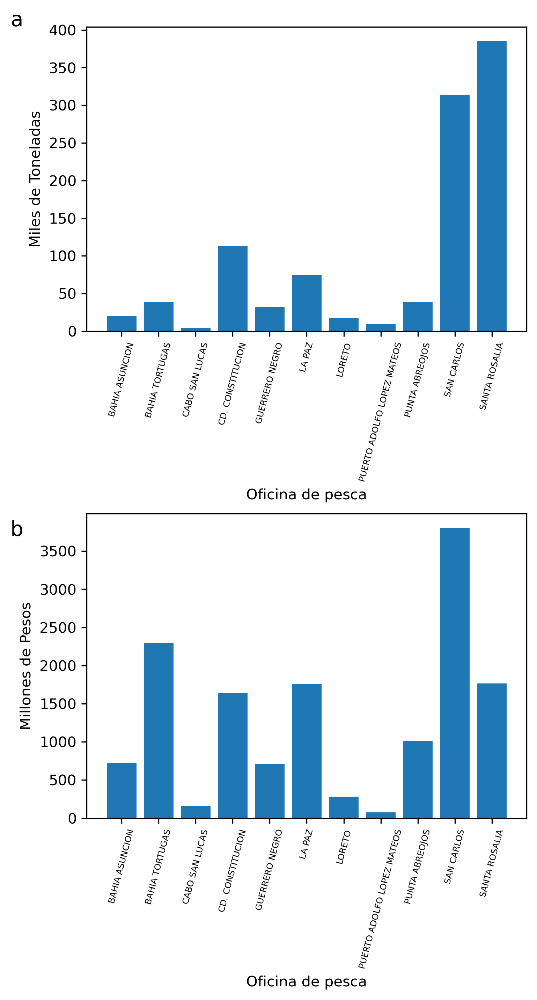

In [13]:
Xzona = df.groupby('Oficina').sum()
fig = plt.figure(figsize=(6,10),dpi=300, facecolor='w', edgecolor='k')

ax = fig.add_subplot(211)
ax.bar(Xzona.index, Xzona['Peso_Kg']/1000000, color="C0")
plt.xticks(rotation=75,fontsize=6)
plt.xlabel('Oficina de pesca')
plt.ylabel('Miles de Toneladas')
plt.text(-3,405, 'a',fontsize=14)

ax2 = fig.add_subplot(212)
ax2.bar(Xzona.index, Xzona['Ganancia_total_Mxn']/1000000, color="C0")
plt.xticks(rotation=75,fontsize=6)
plt.xlabel('Oficina de pesca')
plt.ylabel('Millones de Pesos')
plt.subplots_adjust(left=0.2, bottom=None, right=None, top=None, wspace=None, hspace=0.6)
plt.text(-3,3700, 'b',fontsize=14)
plt.show()
#fig.savefig('baroficinas.png')

In [14]:
dr = read_csv('BDPES/Base2018-2.csv', header=0, index_col=0)
dr=dr[dr.Pesqueria!='OTROS']
Encabezados=dr.columns.values.tolist()

In [15]:
Encabezados

['Oficina',
 'Pesqueria',
 'año',
 'mes',
 'peso',
 'valor',
 'Frecuencia',
 'Date',
 'Zona']

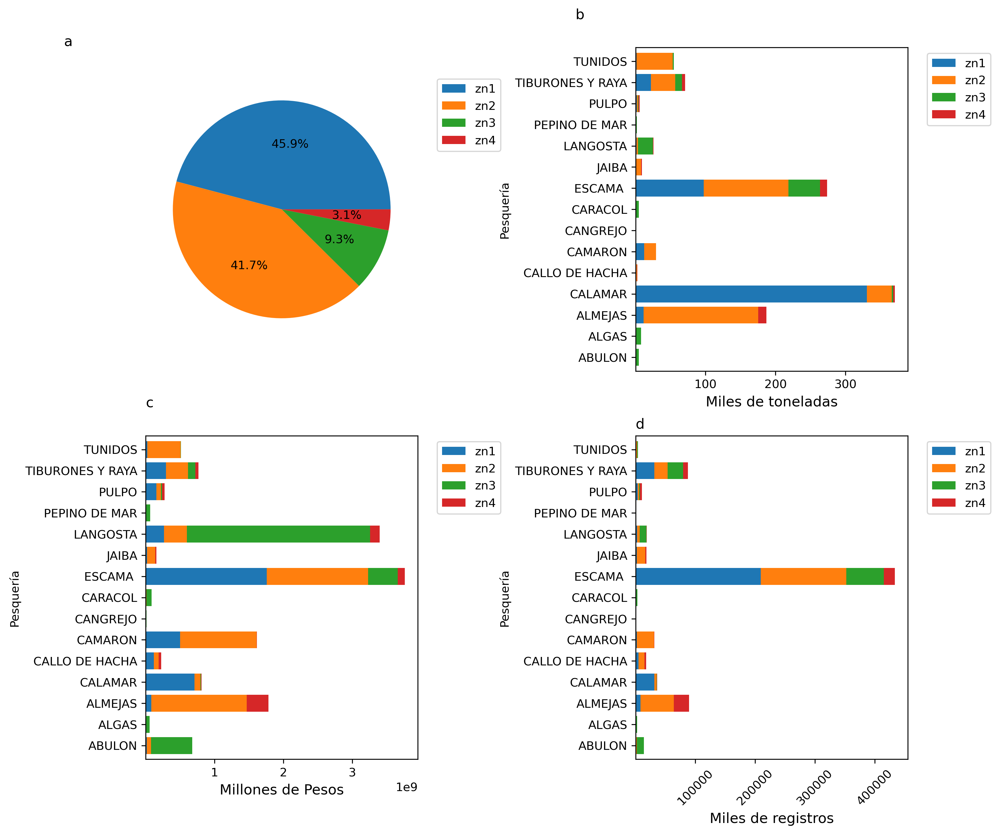

In [16]:

dr['Peso_Kg']=dr.peso/1000000
dr['Ganancia_total_Mxn']=dr.valor/1000000
dr['Frecuencia'] = dr.Frecuencia

Tabla4 = dr.groupby('Zona').sum()
zonas= Tabla4.index.tolist()
tabla5=dr.groupby(['Pesqueria','Zona'],as_index=False).sum().pivot('Pesqueria','Zona')

fig = plt.figure(figsize=(10,10),dpi=300, facecolor='w', edgecolor='k')

ac1=plt.subplot(221)
plt.pie(Tabla4.Peso_Kg, autopct='%1.1f%%',labeldistance=1.1 )
plt.legend(labels=Tabla4.index.tolist(), bbox_to_anchor=(1.05, 1),loc='upper left')
plt.text(-2,1.50,'a',fontsize=12)

ac2=plt.subplot(222)
tabla5.Peso_Kg.plot.barh(rot=0, ax=ac2, stacked=True, width=0.8)
plt.xlabel('Miles de toneladas',size=12)
plt.ylabel('Pesquería')
plt.text(-86,16,'b',fontsize=12)
plt.legend( bbox_to_anchor=(1.05, 1), loc='upper left')

ac3=plt.subplot(223)
tabla5.valor.plot.barh(rot=0,ax=ac3,stacked=True, width=0.8)
plt.xlabel('Millones de Pesos',size=12)
plt.ylabel('Pesquería')
plt.text(-975,16,'c',fontsize=12)
plt.legend( bbox_to_anchor=(1.05, 1), loc='upper left')

ac4=plt.subplot(224)
tabla5.Frecuencia.plot.barh(rot=0,ax=ac4, stacked=True, width=0.8)
plt.xlabel('Miles de registros',size=12)
plt.xticks(rotation=45)
plt.ylabel('Pesquería')
plt.text(-95,15,'d',fontsize=12)
plt.legend( bbox_to_anchor=(1.05, 1), loc='upper left')

plt.subplots_adjust(top=0.92, bottom=0.08, left=0.10, right=1, hspace=0.2,wspace=0.8)

plt.show()

In [17]:
db = read_csv('BDPES/Base2018-2.csv', header=0, index_col=0, low_memory=False)
db=db[db.Pesqueria!='OTROS']

In [18]:
Calamar=db[db.Pesqueria=='CALAMAR']
#db=db[db.Pesqueria!='CALAMAR']

In [19]:
db.columns

Index(['Oficina', 'Pesqueria', 'año', 'mes', 'peso', 'valor', 'Frecuencia',
       'Date', 'Zona'],
      dtype='object')

In [20]:
tabla1=db.groupby(['año','Pesqueria'],as_index=False).sum().pivot('año','Pesqueria').fillna(0)
perValor=tabla1.valor/tabla1.valor.sum()
perPeso=tabla1.peso/tabla1.peso.sum()
perFrec=tabla1.Frecuencia/tabla1.Frecuencia.sum()
IIR= (perValor+perPeso+perFrec)*100


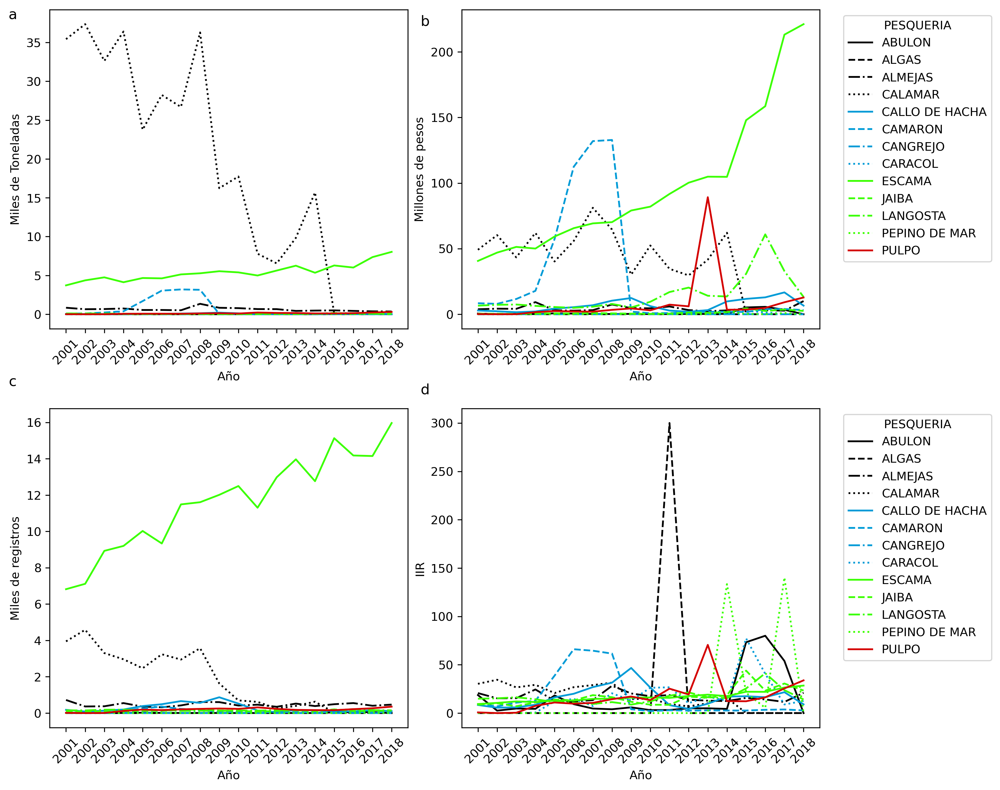

In [21]:
C=db.Zona=='zn1'
ZN1=db[C==True]
#ZN1=ZN1[ZN1.Pesqueria!='CALAMAR']
#X=db.Zona=='zn1'
tZN1=ZN1.groupby(['año','Pesqueria'],as_index=False).sum().pivot('año','Pesqueria').fillna(0)
perValor=tZN1.valor/tZN1.valor.sum()
perPeso=tZN1.peso/tZN1.peso.sum()
perFrec=tZN1.Frecuencia/tZN1.Frecuencia.sum()
IIR= (perValor+perPeso+perFrec)*100
pesquerias= tZN1.peso.columns
NUM_COLORS = 13
LINE_STYLES = ['solid', 'dashed', 'dashdot', 'dotted']
NUM_STYLES = len(LINE_STYLES)
cm = plt.get_cmap('nipy_spectral')

fig = plt.figure(figsize=(10,10),dpi=300, facecolor='w', edgecolor='k')
ax = fig.add_subplot(221)
for i in range(NUM_COLORS):
    lines = ax.plot(tZN1.peso[pesquerias[i]]/1000000)
    lines[0].set_color(cm(i//NUM_STYLES*float(NUM_STYLES)/NUM_COLORS))
    lines[0].set_linestyle(LINE_STYLES[i%NUM_STYLES])

plt.ticklabel_format(style='plain')
plt.text(1998,38, 'a',fontsize=12)
#plt.legend(pesquerias, title='PESQUERIA', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.xticks(ticks=year, labels=None, rotation=45)
plt.xlabel('Año')
plt.ylabel('Miles de Toneladas')

ax = fig.add_subplot(222)
for i in range(NUM_COLORS):
    lines = ax.plot(tZN1.valor[pesquerias[i]]/1000000)
    lines[0].set_color(cm(i//NUM_STYLES*float(NUM_STYLES)/NUM_COLORS))
    lines[0].set_linestyle(LINE_STYLES[i%NUM_STYLES])

plt.ticklabel_format(style='plain')
plt.text(1998,220, 'b',fontsize=12)
plt.legend(pesquerias, title='PESQUERIA', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.xticks(ticks=year, labels=None, rotation=45)
plt.xlabel('Año')
plt.ylabel('Millones de pesos')


ax = fig.add_subplot(223)
for i in range(NUM_COLORS):
    lines = ax.plot(tZN1.Frecuencia[pesquerias[i]]/1000)
    lines[0].set_color(cm(i//NUM_STYLES*float(NUM_STYLES)/NUM_COLORS))
    lines[0].set_linestyle(LINE_STYLES[i%NUM_STYLES])

plt.ticklabel_format(style='plain')
plt.text(1998,18, 'c',fontsize=12)
#plt.legend(pesquerias, title='PESQUERIA', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.xticks(ticks=year, labels=None, rotation=45)
plt.xlabel('Año')
plt.ylabel('Miles de registros')

ax = fig.add_subplot(224)
for i in range(NUM_COLORS):
    lines = ax.plot(IIR[pesquerias[i]])
    lines[0].set_color(cm(i//NUM_STYLES*float(NUM_STYLES)/NUM_COLORS))
    lines[0].set_linestyle(LINE_STYLES[i%NUM_STYLES])

plt.ticklabel_format(style='plain')
plt.text(1998,330, 'd',fontsize=12)
plt.legend(pesquerias, title='PESQUERIA', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.xticks(ticks=year, labels=None, rotation=45)
plt.xlabel('Año')
plt.ylabel('IIR')
plt.subplots_adjust(top=0.92, bottom=0.08, left=0.10, right=1, hspace=0.25,
                    wspace=0.15)
fig.savefig('zn1.png', bbox_inches='tight')
plt.show()

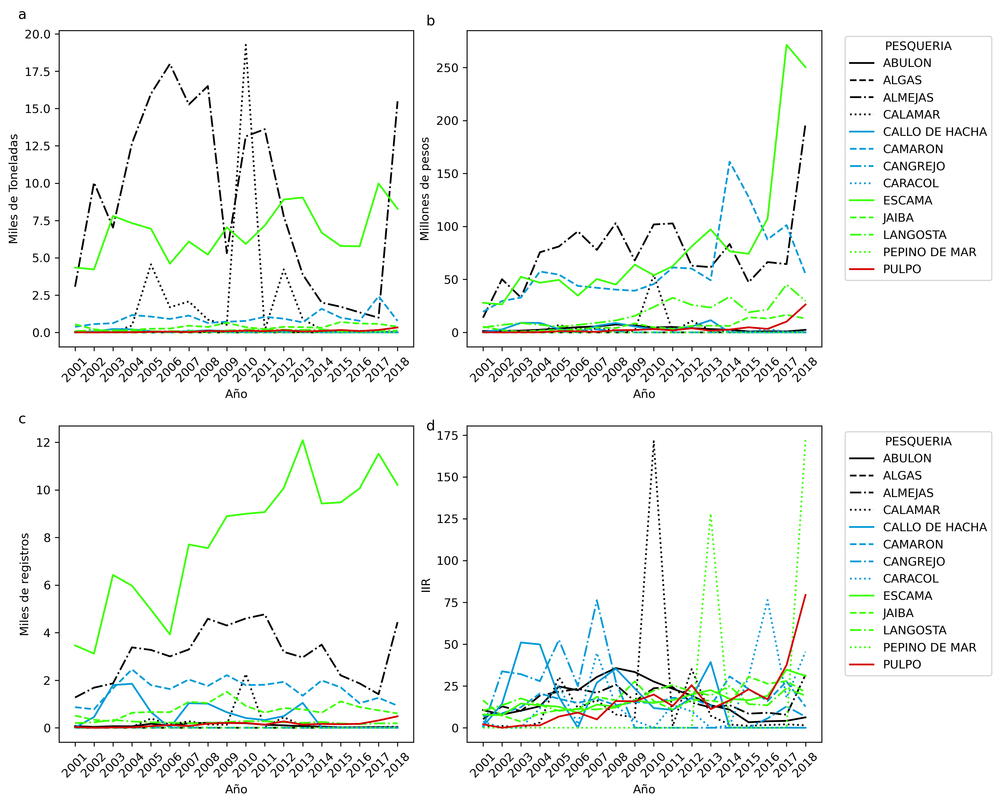

In [22]:
C=db.Zona=='zn2'

ZN1=db[C==True]
#ZN1=ZN1[ZN1.Pesqueria!='OTROS']

#X=db.Zona=='zn2'
tZN1=ZN1.groupby(['año','Pesqueria'],as_index=False).sum().pivot('año','Pesqueria').fillna(0)
perValor=tZN1.valor/tZN1.valor.sum()
perPeso=tZN1.peso/tZN1.peso.sum()
perFrec=tZN1.Frecuencia/tZN1.Frecuencia.sum()
IIR= (perValor+perPeso+perFrec)*100
pesquerias= tZN1.peso.columns
NUM_COLORS = 13
LINE_STYLES = ['solid', 'dashed', 'dashdot', 'dotted']
NUM_STYLES = len(LINE_STYLES)
cm = plt.get_cmap('nipy_spectral')

fig = plt.figure(figsize=(10,10),dpi=300, facecolor='w', edgecolor='k')
ax = fig.add_subplot(221)
for i in range(NUM_COLORS):
    lines = ax.plot(tZN1.peso[pesquerias[i]]/1000000)
    lines[0].set_color(cm(i//NUM_STYLES*float(NUM_STYLES)/NUM_COLORS))
    lines[0].set_linestyle(LINE_STYLES[i%NUM_STYLES])

plt.ticklabel_format(style='plain')
plt.text(1998,21, 'a',fontsize=12)
#plt.legend(pesquerias, title='PESQUERIA', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.xticks(ticks=year, labels=None, rotation=45)
plt.xlabel('Año')
plt.ylabel('Miles de Toneladas')

ax = fig.add_subplot(222)
for i in range(NUM_COLORS):
    lines = ax.plot(tZN1.valor[pesquerias[i]]/1000000)
    lines[0].set_color(cm(i//NUM_STYLES*float(NUM_STYLES)/NUM_COLORS))
    lines[0].set_linestyle(LINE_STYLES[i%NUM_STYLES])

plt.ticklabel_format(style='plain')
plt.text(1998,290, 'b',fontsize=12)
plt.legend(pesquerias, title='PESQUERIA', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.xticks(ticks=year, labels=None, rotation=45)
plt.xlabel('Año')
plt.ylabel('Millones de pesos')


ax = fig.add_subplot(223)
for i in range(NUM_COLORS):
    lines = ax.plot(tZN1.Frecuencia[pesquerias[i]]/1000)
    lines[0].set_color(cm(i//NUM_STYLES*float(NUM_STYLES)/NUM_COLORS))
    lines[0].set_linestyle(LINE_STYLES[i%NUM_STYLES])

plt.ticklabel_format(style='plain')
plt.text(1998,12.8, 'c',fontsize=12)
#plt.legend(pesquerias, title='PESQUERIA', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.xticks(ticks=year, labels=None, rotation=45)
plt.xlabel('Año')
plt.ylabel('Miles de registros')

ax = fig.add_subplot(224)
for i in range(NUM_COLORS):
    lines = ax.plot(IIR[pesquerias[i]])
    lines[0].set_color(cm(i//NUM_STYLES*float(NUM_STYLES)/NUM_COLORS))
    lines[0].set_linestyle(LINE_STYLES[i%NUM_STYLES])

plt.ticklabel_format(style='plain')
plt.text(1998,178, 'd',fontsize=12)
plt.legend(pesquerias, title='PESQUERIA', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.xticks(ticks=year, labels=None, rotation=45)
plt.xlabel('Año')
plt.ylabel('IIR')
plt.subplots_adjust(top=0.92, bottom=0.08, left=0.10, right=1, hspace=0.25,
                    wspace=0.15)
fig.savefig('zn2.png', bbox_inches='tight')
plt.show()

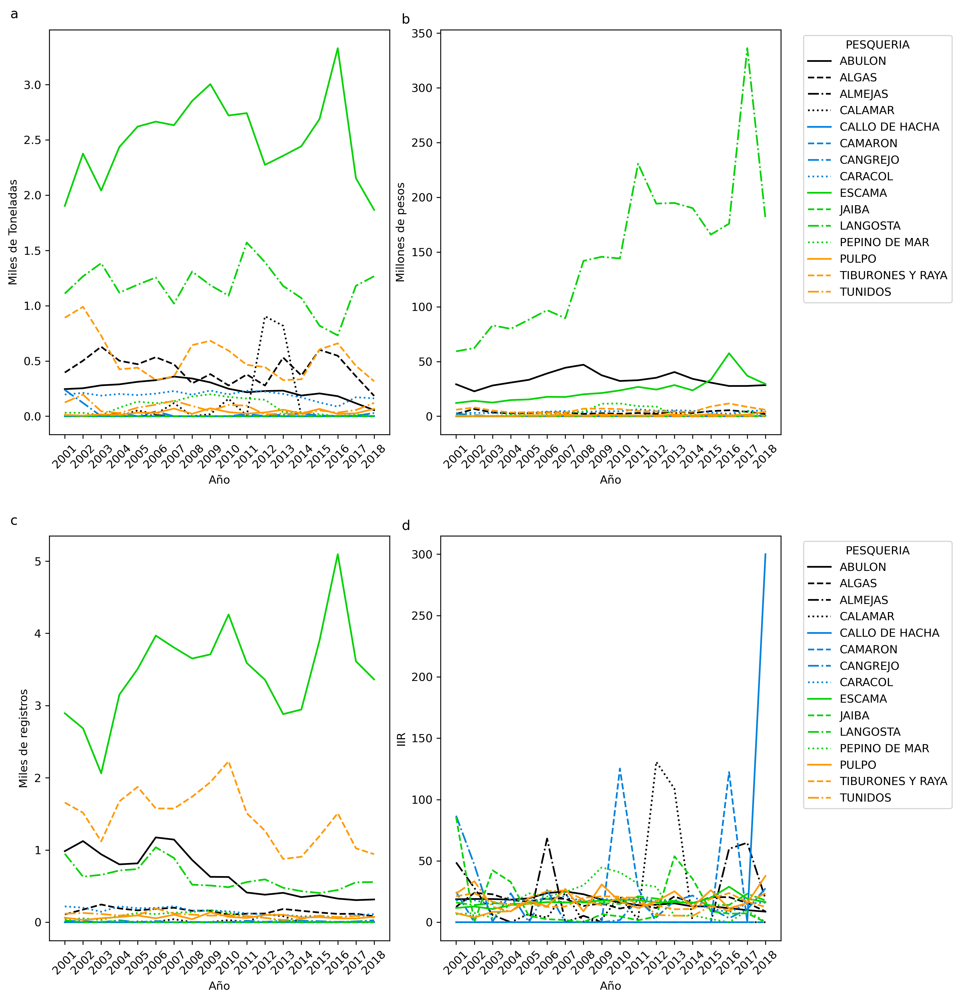

In [23]:
C=db.Zona=='zn3'

ZN1=db[C==True]
#ZN1=ZN1[ZN1.Pesqueria!='OTROS']
#ZN1=ZN1[ZN1.Pesqueria!='TUNIDOS']
#ZN1=ZN1[ZN1.Pesqueria!='ALGAS']
#ZN1=ZN1[ZN1.Pesqueria!='CALAMAR']
#X=db.Zona=='zn2'
tZN1=ZN1.groupby(['año','Pesqueria'],as_index=False).sum().pivot('año','Pesqueria').fillna(0)
perValor=tZN1.valor/tZN1.valor.sum()
perPeso=tZN1.peso/tZN1.peso.sum()
perFrec=tZN1.Frecuencia/tZN1.Frecuencia.sum()
IIR= (perValor+perPeso+perFrec)*100
pesquerias= tZN1.peso.columns
NUM_COLORS = len(pesquerias)
LINE_STYLES = ['solid', 'dashed', 'dashdot', 'dotted']
NUM_STYLES = len(LINE_STYLES)
cm = plt.get_cmap('nipy_spectral')

fig = plt.figure(figsize=(10,10),dpi=300, facecolor='w', edgecolor='k')
ax = fig.add_subplot(221)
for i in range(NUM_COLORS):
    lines = ax.plot(tZN1.peso[pesquerias[i]]/1000000)
    lines[0].set_color(cm(i//NUM_STYLES*float(NUM_STYLES)/NUM_COLORS))
    lines[0].set_linestyle(LINE_STYLES[i%NUM_STYLES])

plt.ticklabel_format(style='plain')
plt.text(1998,3.6, 'a',fontsize=12)
#plt.legend(pesquerias, title='PESQUERIA', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.xticks(ticks=year, labels=None, rotation=45)
plt.xlabel('Año')
plt.ylabel('Miles de Toneladas')

ax = fig.add_subplot(222)
for i in range(NUM_COLORS):
    lines = ax.plot(tZN1.valor[pesquerias[i]]/1000000)
    lines[0].set_color(cm(i//NUM_STYLES*float(NUM_STYLES)/NUM_COLORS))
    lines[0].set_linestyle(LINE_STYLES[i%NUM_STYLES])

plt.ticklabel_format(style='plain')
plt.text(1998,359, 'b',fontsize=12)
plt.legend(pesquerias, title='PESQUERIA', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.xticks(ticks=year, labels=None, rotation=45)
plt.xlabel('Año')
plt.ylabel('Millones de pesos')


ax = fig.add_subplot(223)
for i in range(NUM_COLORS):
    lines = ax.plot(tZN1.Frecuencia[pesquerias[i]]/1000)
    lines[0].set_color(cm(i//NUM_STYLES*float(NUM_STYLES)/NUM_COLORS))
    lines[0].set_linestyle(LINE_STYLES[i%NUM_STYLES])

plt.ticklabel_format(style='plain')
plt.text(1998,5.5, 'c',fontsize=12)
#plt.legend(pesquerias, title='PESQUERIA', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.xticks(ticks=year, labels=None, rotation=45)
plt.xlabel('Año')
plt.ylabel('Miles de registros')

ax = fig.add_subplot(224)
for i in range(NUM_COLORS):
    lines = ax.plot(IIR[pesquerias[i]])
    lines[0].set_color(cm(i//NUM_STYLES*float(NUM_STYLES)/NUM_COLORS))
    lines[0].set_linestyle(LINE_STYLES[i%NUM_STYLES])

plt.ticklabel_format(style='plain')
plt.text(1998,320, 'd',fontsize=12)
plt.legend(pesquerias, title='PESQUERIA', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.xticks(ticks=year, labels=None, rotation=45)
plt.xlabel('Año')
plt.ylabel('IIR')
plt.subplots_adjust(top=1.2, bottom=0.08, left=0.10, right=1, hspace=0.25,
                    wspace=0.15)
fig.savefig('zn3.png', bbox_inches='tight')
plt.show()

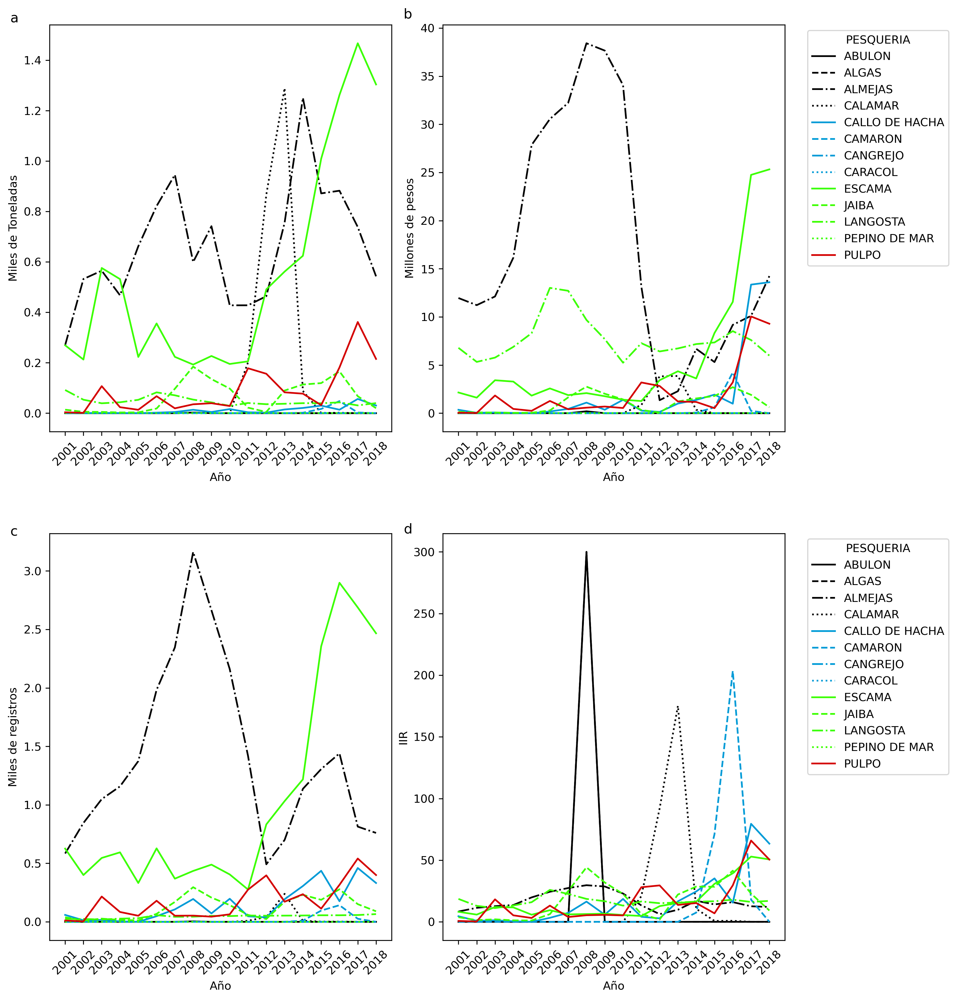

In [24]:
C=db.Zona=='zn4'

ZN1=db[C==True]
#ZN1=ZN1[ZN1.Pesqueria!='OTROS']

#X=db.Zona=='zn2'
tZN1=ZN1.groupby(['año','Pesqueria'],as_index=False).sum().pivot('año','Pesqueria').fillna(0)
perValor=tZN1.valor/tZN1.valor.sum()
perPeso=tZN1.peso/tZN1.peso.sum()
perFrec=tZN1.Frecuencia/tZN1.Frecuencia.sum()
IIR= (perValor+perPeso+perFrec)*100
pesquerias= tZN1.peso.columns
NUM_COLORS = 13
LINE_STYLES = ['solid', 'dashed', 'dashdot', 'dotted']
NUM_STYLES = len(LINE_STYLES)
cm = plt.get_cmap('nipy_spectral')

fig = plt.figure(figsize=(10,10),dpi=300, facecolor='w', edgecolor='k')
ax = fig.add_subplot(221)
for i in range(NUM_COLORS):
    lines = ax.plot(tZN1.peso[pesquerias[i]]/1000000)
    lines[0].set_color(cm(i//NUM_STYLES*float(NUM_STYLES)/NUM_COLORS))
    lines[0].set_linestyle(LINE_STYLES[i%NUM_STYLES])

plt.ticklabel_format(style='plain')
plt.text(1998,1.55, 'a',fontsize=12)
#plt.legend(pesquerias, title='PESQUERIA', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.xticks(ticks=year, labels=None, rotation=45)
plt.xlabel('Año')
plt.ylabel('Miles de Toneladas')

ax = fig.add_subplot(222)
for i in range(NUM_COLORS):
    lines = ax.plot(tZN1.valor[pesquerias[i]]/1000000)
    lines[0].set_color(cm(i//NUM_STYLES*float(NUM_STYLES)/NUM_COLORS))
    lines[0].set_linestyle(LINE_STYLES[i%NUM_STYLES])

plt.ticklabel_format(style='plain')
plt.text(1998,41, 'b',fontsize=12)
plt.legend(pesquerias, title='PESQUERIA', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.xticks(ticks=year, labels=None, rotation=45)
plt.xlabel('Año')
plt.ylabel('Millones de pesos')


ax = fig.add_subplot(223)
for i in range(NUM_COLORS):
    lines = ax.plot(tZN1.Frecuencia[pesquerias[i]]/1000)
    lines[0].set_color(cm(i//NUM_STYLES*float(NUM_STYLES)/NUM_COLORS))
    lines[0].set_linestyle(LINE_STYLES[i%NUM_STYLES])

plt.ticklabel_format(style='plain')
plt.text(1998,3.3, 'c',fontsize=12)
#plt.legend(pesquerias, title='PESQUERIA', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.xticks(ticks=year, labels=None, rotation=45)
plt.xlabel('Año')
plt.ylabel('Miles de registros')

ax = fig.add_subplot(224)
for i in range(NUM_COLORS):
    lines = ax.plot(IIR[pesquerias[i]])
    lines[0].set_color(cm(i//NUM_STYLES*float(NUM_STYLES)/NUM_COLORS))
    lines[0].set_linestyle(LINE_STYLES[i%NUM_STYLES])

plt.ticklabel_format(style='plain')
plt.text(1998,315, 'd',fontsize=12)
plt.legend(pesquerias, title='PESQUERIA', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.xticks(ticks=year, labels=None, rotation=45)
plt.xlabel('Año')
plt.ylabel('IIR')
plt.subplots_adjust(top=1.2, bottom=0.08, left=0.10, right=1, hspace=0.25,
                    wspace=0.15)
fig.savefig('zn4.png', bbox_inches='tight')
plt.show()

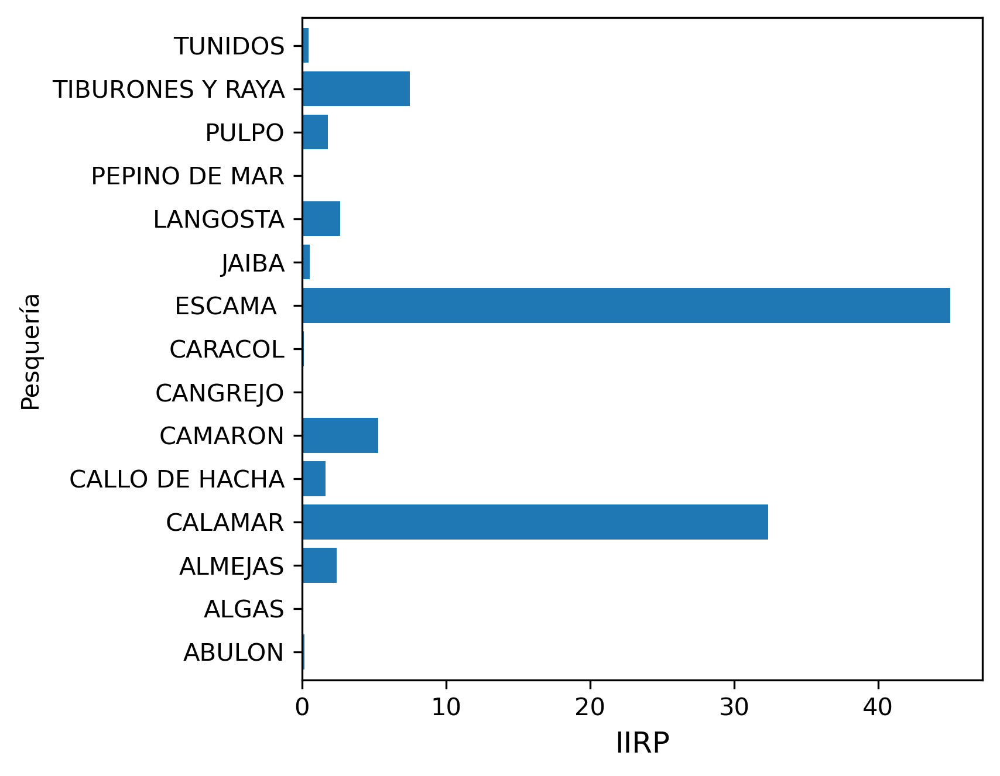

In [25]:
C=db.Zona=='zn1'
ZN1=db[C==True]
tZN1=ZN1.groupby(['Pesqueria'],as_index=False).sum()
tZN1['IIRP'] = ((tZN1.valor/tZN1.valor.sum())+(tZN1.peso/tZN1.peso.sum())+(tZN1.Frecuencia/tZN1.Frecuencia.sum()))*100/3
tZN1.index=pd.Series(tZN1.Pesqueria.values)

fig = plt.figure(figsize=(5,5),dpi=300, facecolor='w', edgecolor='k')
ac2=plt.subplot(111)
tZN1.IIRP.plot.barh(rot=0, ax=ac2, stacked=True, width=0.8)
plt.xlabel('IIRP',size=12)
plt.ylabel('Pesquería')
plt.show()

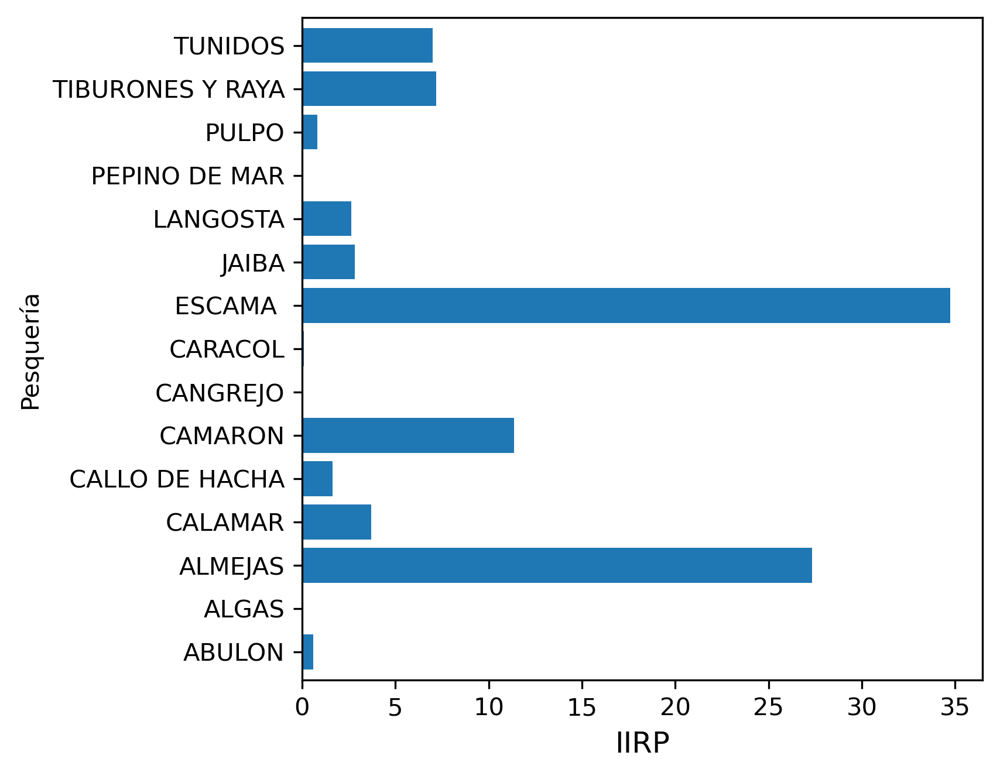

In [26]:
C=db.Zona=='zn2'
ZN1=db[C==True]
tZN1=ZN1.groupby(['Pesqueria'],as_index=False).sum()
tZN1['IIRP'] = ((tZN1.valor/tZN1.valor.sum())+(tZN1.peso/tZN1.peso.sum())+(tZN1.Frecuencia/tZN1.Frecuencia.sum()))*100/3
tZN1.index=pd.Series(tZN1.Pesqueria.values)

fig = plt.figure(figsize=(5,5),dpi=300, facecolor='w', edgecolor='k')
ac2=plt.subplot(111)
tZN1.IIRP.plot.barh(rot=0, ax=ac2, stacked=True, width=0.8)
plt.xlabel('IIRP',size=12)
plt.ylabel('Pesquería')
plt.show()

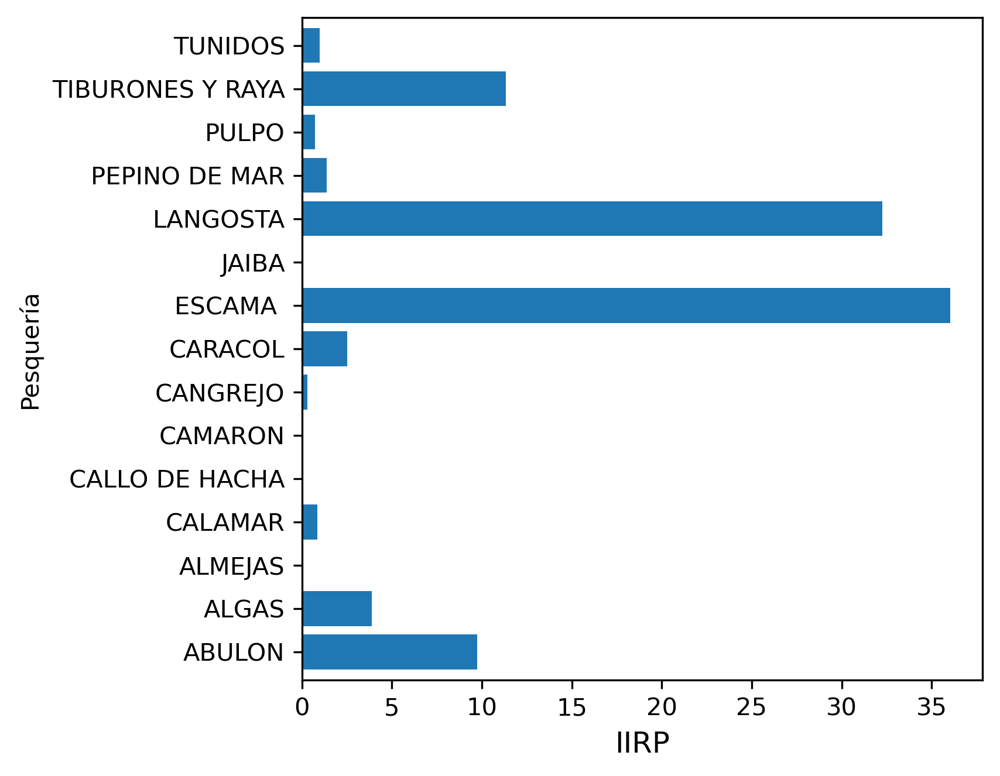

In [27]:
C=db.Zona=='zn3'
ZN1=db[C==True]
tZN1=ZN1.groupby(['Pesqueria'],as_index=False).sum()
tZN1['IIRP'] = ((tZN1.valor/tZN1.valor.sum())+(tZN1.peso/tZN1.peso.sum())+(tZN1.Frecuencia/tZN1.Frecuencia.sum()))*100/3
tZN1.index=pd.Series(tZN1.Pesqueria.values)

fig = plt.figure(figsize=(5,5),dpi=300, facecolor='w', edgecolor='k')
ac2=plt.subplot(111)
tZN1.IIRP.plot.barh(rot=0, ax=ac2, stacked=True, width=0.8)
plt.xlabel('IIRP',size=12)
plt.ylabel('Pesquería')
plt.show()

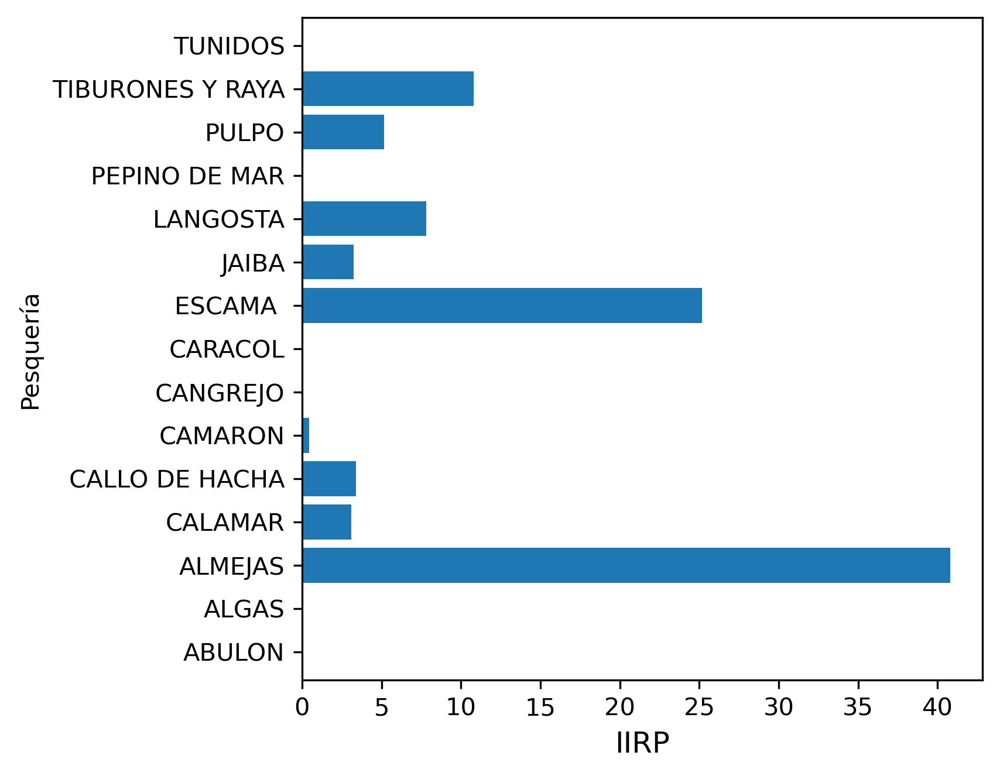

In [28]:
C=db.Zona=='zn4'
ZN1=db[C==True]
tZN1=ZN1.groupby(['Pesqueria'],as_index=False).sum()
tZN1['IIRP'] = ((tZN1.valor/tZN1.valor.sum())+(tZN1.peso/tZN1.peso.sum())+(tZN1.Frecuencia/tZN1.Frecuencia.sum()))*100/3
tZN1.index=pd.Series(tZN1.Pesqueria.values)

fig = plt.figure(figsize=(5,5),dpi=300, facecolor='w', edgecolor='k')
ac2=plt.subplot(111)
tZN1.IIRP.plot.barh(rot=0, ax=ac2, stacked=True, width=0.8)
plt.xlabel('IIRP',size=12)
plt.ylabel('Pesquería')
plt.show()

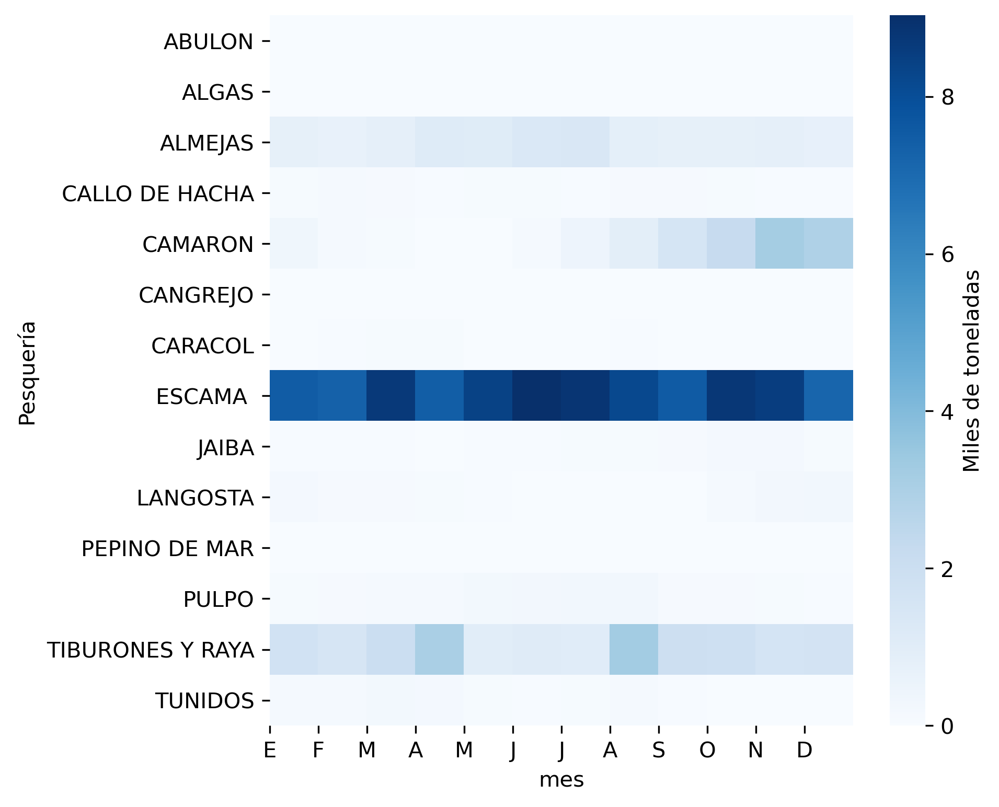

In [34]:
import seaborn as sns
ST=db.drop(columns=['Oficina','año'])
C=ST.Zona=='zn1'
ZN1=ST[C==True]
X=db.Zona=='zn1'
XX=db.Pesqueria!='CALAMAR'
L=X&XX
tt=db[L==True]
tZN1=ZN1.groupby(['Date','Pesqueria'],as_index=False).sum().pivot('Date','Pesqueria').fillna(0)
ta1=tt.groupby(['Pesqueria','mes'],as_index=False).sum().pivot('Pesqueria','mes').fillna(0)

fig=plt.figure(1,figsize=(6,6),dpi=300)

plt.subplot(111)
ax3=sns.heatmap(ta1.peso/1000000, cmap="Blues",cbar_kws={'label': 'Miles de toneladas'})
plt.ylabel('Pesquería')
plt.xticks([0,1,2,3,4,5,6,7,8,9,10,11],['E','F','M','A','M','J','J','A','S','O','N','D'])



fig.savefig('cap1.png', bbox_inches='tight')

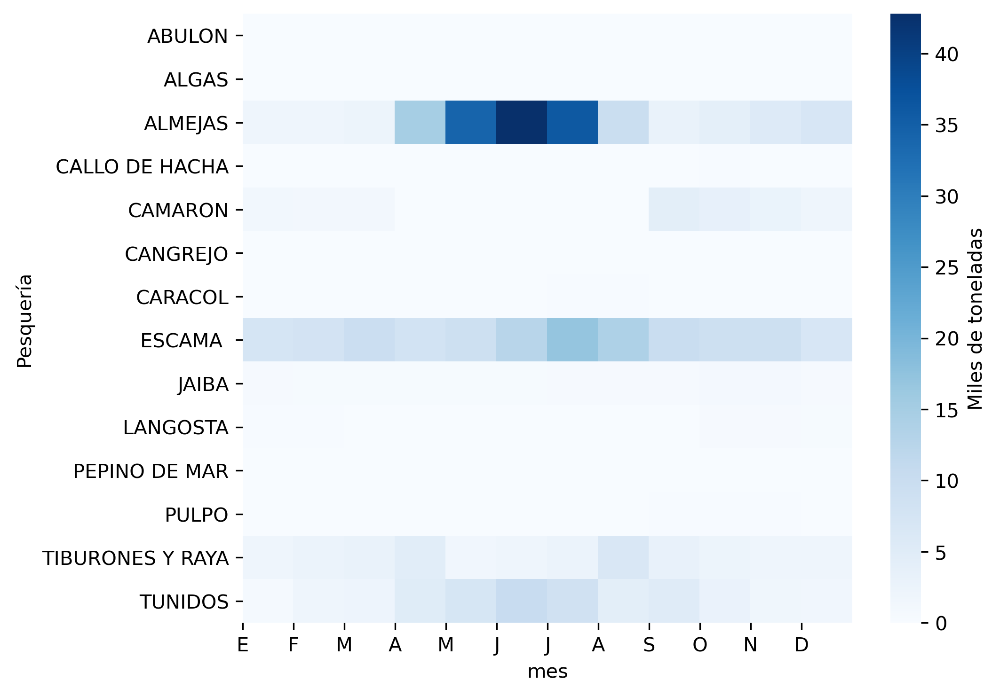

In [35]:
C=ST.Zona=='zn2'
ZN1=ST[C==True]
X=db.Zona=='zn2'
XX=db.Pesqueria!='CALAMAR'
L=X&XX
tt=db[L==True]
tZN1=ZN1.groupby(['Date','Pesqueria'],as_index=False).sum().pivot('Date','Pesqueria').fillna(0)
ta1=tt.groupby(['Pesqueria','mes'],as_index=False).sum().pivot('Pesqueria','mes').fillna(0)

fig=plt.figure(1,figsize=(6,6),dpi=300)

plt.subplot(111)
ax3=sns.heatmap(ta1.peso/1000000, cmap="Blues",cbar_kws={'label': 'Miles de toneladas'})
plt.ylabel('Pesquería')
plt.subplots_adjust(top=0.82, bottom=0.10, left=0.1, right=1, hspace=0.55,
                    wspace=0.65)
plt.xticks([0,1,2,3,4,5,6,7,8,9,10,11],['E','F','M','A','M','J','J','A','S','O','N','D'])
fig.savefig('cap2.png', bbox_inches='tight')

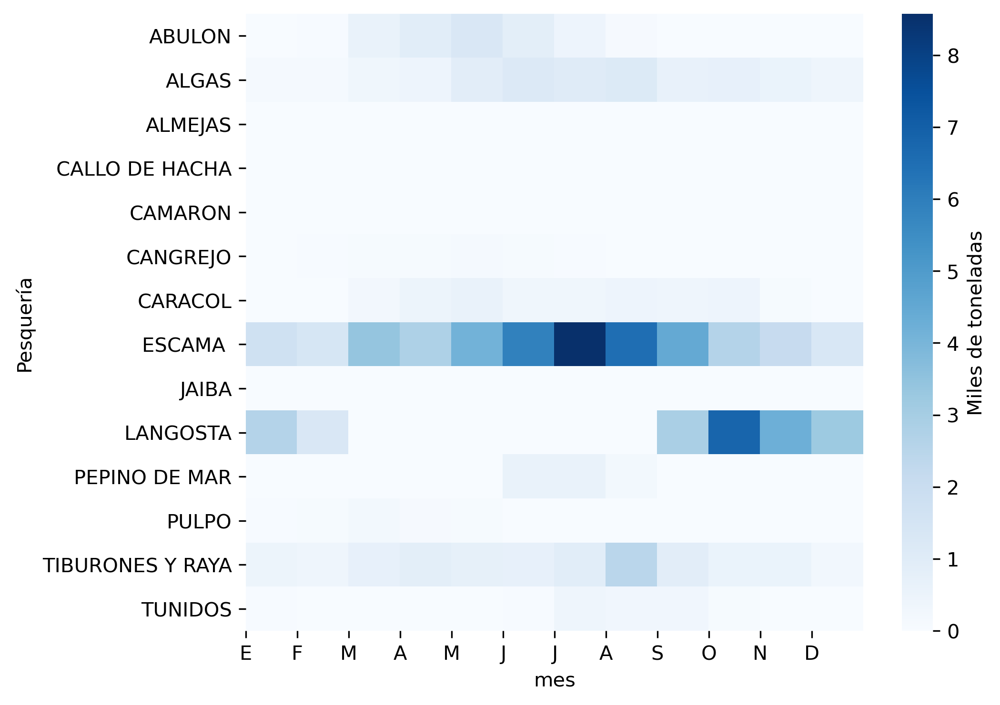

In [36]:
C=ST.Zona=='zn3'
ZN1=ST[C==True]
X=db.Zona=='zn3'
XX=db.Pesqueria!='CALAMAR'
L=X&XX
tt=db[L==True]
tZN1=ZN1.groupby(['Date','Pesqueria'],as_index=False).sum().pivot('Date','Pesqueria').fillna(0)
ta1=tt.groupby(['Pesqueria','mes'],as_index=False).sum().pivot('Pesqueria','mes').fillna(0)

fig=plt.figure(1,figsize=(6,6),dpi=300)

plt.subplot(111)
ax3=sns.heatmap(ta1.peso/1000000, cmap="Blues",cbar_kws={'label': 'Miles de toneladas'})
plt.ylabel('Pesquería')
plt.subplots_adjust(top=0.82, bottom=0.10, left=0.1, right=1, hspace=0.55,
                    wspace=0.65)
plt.xticks([0,1,2,3,4,5,6,7,8,9,10,11],['E','F','M','A','M','J','J','A','S','O','N','D'])

fig.savefig('cap3.png', bbox_inches='tight')

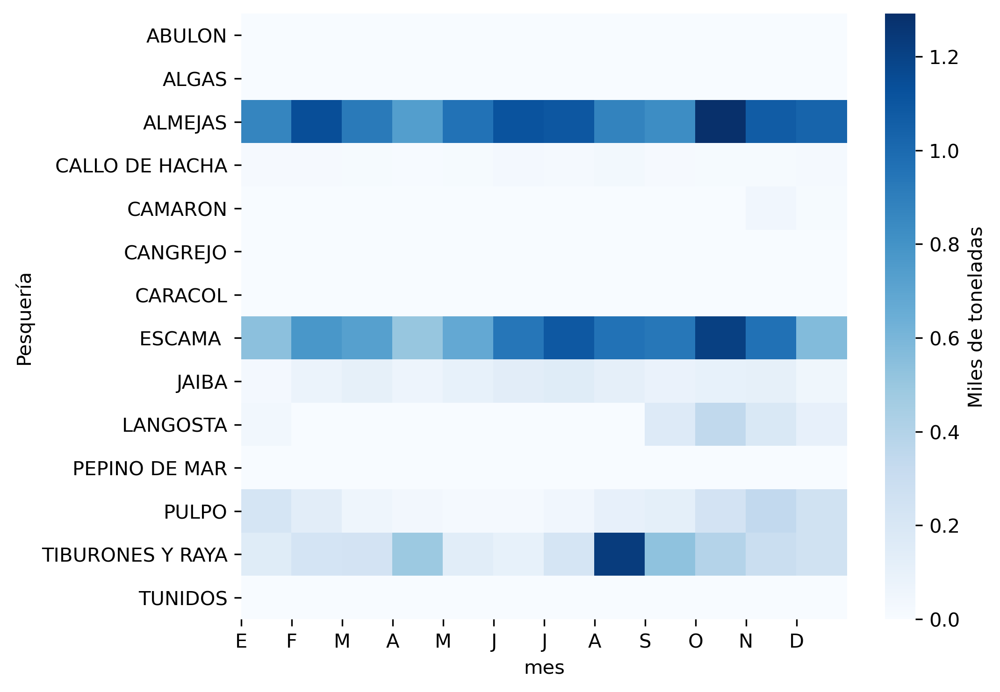

In [37]:
C=ST.Zona=='zn4'
ZN1=ST[C==True]
X=db.Zona=='zn4'
XX=db.Pesqueria!='CALAMAR'
L=X&XX
tt=db[L==True]
tZN1=ZN1.groupby(['Date','Pesqueria'],as_index=False).sum().pivot('Date','Pesqueria').fillna(0)
ta1=tt.groupby(['Pesqueria','mes'],as_index=False).sum().pivot('Pesqueria','mes').fillna(0)

fig=plt.figure(1,figsize=(6,6),dpi=300)

plt.subplot(111)
ax3=sns.heatmap(ta1.peso/1000000, cmap="Blues",cbar_kws={'label': 'Miles de toneladas'})
plt.ylabel('Pesquería')
plt.subplots_adjust(top=0.82, bottom=0.10, left=0.1, right=1, hspace=0.55,
                    wspace=0.65)
plt.xticks([0,1,2,3,4,5,6,7,8,9,10,11],['E','F','M','A','M','J','J','A','S','O','N','D'])
fig.savefig('cap4.png', bbox_inches='tight')

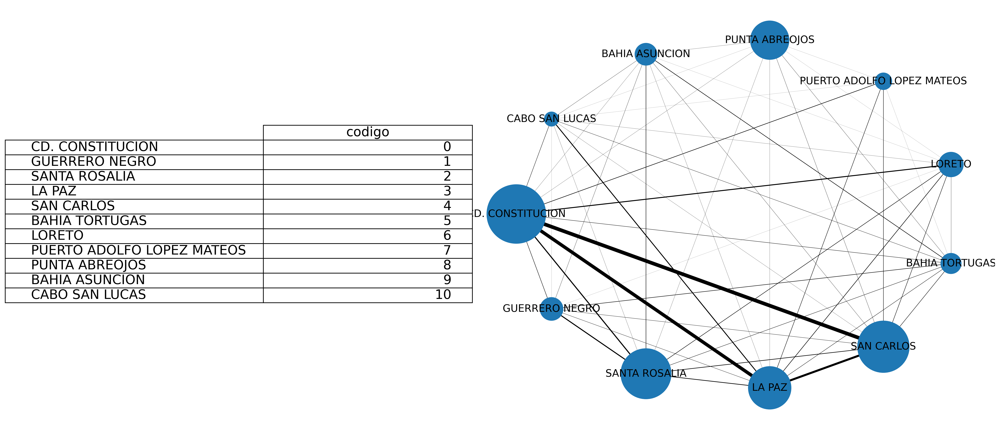

<Figure size 432x288 with 0 Axes>

In [ ]:
import networkx as nx

df = pd.read_csv('BDPES/BDlista2018.csv', low_memory=False)

NMOficinas = pd.Series(df.Oficina.unique())


df.Oficina=pd.factorize(df.Oficina)[0]

df.Oficina=pd.factorize(df.Oficina)[0]
Oficinas = pd.Series(df.Oficina.unique())
Sitio_Desembarque = pd.Series(df.Sitio_Desembarque.unique())

d = {}
for i in range(0,len(Oficinas)):
    dd = df.loc[df['Oficina'] == Oficinas[i]]
    DDD = pd.Series(dd.Sitio_Desembarque.unique())
    DDDD = [x for x in DDD if str(x) != 'nan']
    d[i] = DDDD
    
result = []
for i in range(0, len(Oficinas)):
    row = []
    for j in range(0, len(Oficinas)):
        row.append(len(set(d[i]) & set(d[j])))
    result.append(row)

ORT = pd.DataFrame(result, columns = Oficinas, index = Oficinas) 

i = 0
j = 0
k = 0
dr=pd.DataFrame([],columns=['a','b','c'], index=(range(0,(len(Oficinas)**2))))
while i < 121:
    
    while j < len(Oficinas):
        k=0
        while k < len(Oficinas):
            r=(len(set(d[j]) & set(d[k])))
            dr.a[i]=Oficinas[j]
            dr.b[i]=Oficinas[k]
            dr.c[i]=r
            k+=1
            i=i+1
        j+=1

dr2=dr[dr.a!=dr.b]
capEsc=df[df.Pesqueria=='ESCAMA ']
tabla1=df.groupby(['Oficina','Pesqueria'],as_index=False).sum().pivot('Oficina','Pesqueria').fillna(0)
Peso=tabla1.Peso_Kg
CaptOF=Peso['ESCAMA ']


dr3=dr2[dr2.c!=0].dropna()
dr3.drop('c', inplace=True, axis=1)



dr4=dr3.transpose()
columnas=dr4.columns.tolist()
dr4.sort_values(by=columnas, inplace=True)
dr5=dr4.transpose().drop_duplicates()
dr4 = pd.DataFrame(np.sort(dr3.values,axis=1),columns=dr3.columns).drop_duplicates()
dr2.reset_index(inplace=True)
dr4.reset_index(inplace=True)

dc=['cc']
IC=[]
ICC=pd.DataFrame(IC,columns=dc)
for t in range(0,len(dr4)):
    A=dr4.a[t]
    B=dr4.b[t]
    for l in range(0,len(dr2)):
        AA=dr2.a[l]
        BB=dr2.b[l]
        if A==AA and B==BB:
            ICC.loc[t]=dr2.c[l]
        
dr4['c']=ICC
dr5=dr4

dr5.drop('c', inplace=True, axis=1)
dr5.drop('index', inplace=True, axis=1)
records = dr5.to_records(index=False)
conexiones = list(records)

PCO=(CaptOF/10000)
from matplotlib.patches import Polygon
Figure=plt.figure(figsize=[10,8], dpi=300) 
# Create a networkx graph object

my_graph = nx.Graph() 


# Add edges to to the graph object
# Each tuple represents an edge between two nodes
my_graph.add_nodes_from(list(Oficinas))
my_graph.add_edges_from(conexiones)

#ax1 = plt.subplot(122)
#ax1.margins(-0.1, -0.1)  
nx.draw_shell(my_graph,
        node_size=PCO,
        width=5*ICC['cc']/max(ICC['cc']),
        #edge_cmap=plt.cm.gray,
        with_labels=True,
        labels=NMOficinas,
        horizontalalignment='center',
        font_size=14,
        #alpha=0.8
       )
l,r = plt.xlim()
u,d = plt.ylim()
plt.xlim(l-0.1,r+0.1)
plt.ylim(u-0.1,d+0.1)


#ax2 = plt.subplot(121)
#ax2.margins(2, 2)   
#ax2.axis('tight')
#ax2.axis('off')

col_labels = ['codigo']
row_labels = ['CD. CONSTITUCION',
              'GUERRERO NEGRO',
              'SANTA ROSALIA',
              'LA PAZ',
              'SAN CARLOS',
              'BAHIA TORTUGAS',
              'LORETO',
              'PUERTO ADOLFO LOPEZ MATEOS',
              'PUNTA ABREOJOS',
              'BAHIA ASUNCION',
              'CABO SAN LUCAS']
table_vals = [[0],[1],[2],[3],[4],[5],[6],[7],[8],[9],[10]]

the_table2 = plt.table(cellText=table_vals,
                      rowLabels=row_labels,
                      colLabels=col_labels,
                      loc='left')
the_table2.scale(0.4,1.7)
the_table2.auto_set_font_size(False)
the_table2.set_fontsize(18)

#plt.subplots_adjust(top=1.2, bottom=0.08, left=0.08, right=0.4, hspace=0.002,
 #                   wspace=0.1)
plt.show()
plt.savefig('nodos.png')


In [ ]:
df[df.Region != '0']

,Index,Entidad_federativa,Tipo_de_pesca,Year,Mes,Dia,Oficina,Latitud,Longitud,Folio,...,Class,Order,Family,Genus,Ganancia_total_Mxn,Peso_Kg,Precio_Mxn,Zona,Pesqueria,Region
176650,176650,BAJA CALIFORNIA SUR,ARTESANAL,2005,12,31,3,24.1422,-110.311,BA367593,...,Actinopterygii,Perciformes,Serranidae,Mycteroperca,1050.0,35.0,30.0,zn1,ESCAMA,Cabo Pulmo
176651,176651,BAJA CALIFORNIA SUR,ARTESANAL,2005,12,31,3,24.1422,-110.311,BA367593,...,Actinopterygii,Perciformes,Lutjanidae,Lutjanus,49420.0,1765.0,28.0,zn1,ESCAMA,Cabo Pulmo
176652,176652,BAJA CALIFORNIA SUR,ARTESANAL,2005,12,31,3,24.1422,-110.311,BA367593,...,Elasmobranchii,Myliobatiformes,Myliobatidae,Mobula,3030.0,202.0,15.0,zn1,TIBURONES Y RAYA,Cabo Pulmo
176653,176653,BAJA CALIFORNIA SUR,ARTESANAL,2005,12,31,3,24.1422,-110.311,BA367593,...,Actinopterygii,Perciformes,Scombridae,Scomberomorus,2840.0,284.0,10.0,zn1,ESCAMA,Cabo Pulmo
176654,176654,BAJA CALIFORNIA SUR,ARTESANAL,2005,12,31,6,26.0128,-111.343,BA298788,...,Actinopterygii,Perciformes,Serranidae,Mycteroperca,5200.0,200.0,26.0,zn1,ESCAMA,Mulege
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
804082,804082,BAJA CALIFORNIA SUR,INDUSTRIAL,2018,12,19,3,24.1422,-110.311,BA1324391,...,Actinopterygii,Clupeiformes,Clupeidae,NaN,4400.0,220.0,20.0,zn1,OTROS,La Ribera
804083,804083,BAJA CALIFORNIA SUR,INDUSTRIAL,2018,12,19,3,24.1422,-110.311,BA1324530,...,Actinopterygii,Perciformes,Scombridae,Scomber,5450.0,218.0,25.0,zn1,OTROS,La Ribera
804084,804084,BAJA CALIFORNIA SUR,INDUSTRIAL,2018,12,19,3,24.1422,-110.311,BA1324530,...,Actinopterygii,Clupeiformes,Clupeidae,NaN,7800.0,312.0,25.0,zn1,OTROS,La Ribera
804089,804089,BAJA CALIFORNIA SUR,INDUSTRIAL,2018,12,26,6,26.0128,-111.343,BA1151126,...,Actinopterygii,Perciformes,Scombridae,Scomber,13500.0,135.0,100.0,zn1,OTROS,Loreto


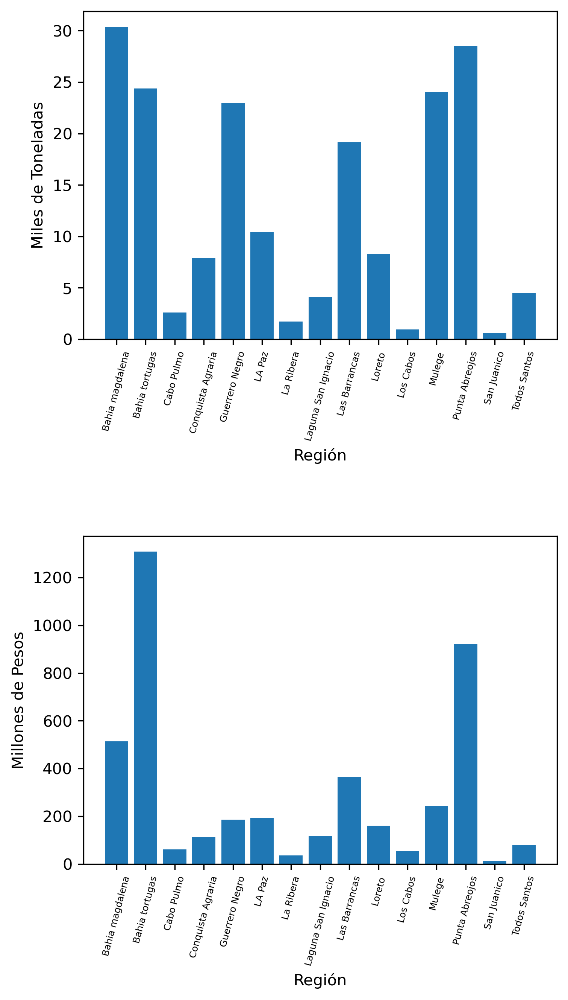

In [ ]:
Xzona = df[df.Region!='0'].groupby('Region').sum()
fig = plt.figure(figsize=(6,10),dpi=300, facecolor='w', edgecolor='k')

ax = fig.add_subplot(211)
ax.bar(Xzona.index, Xzona['Peso_Kg']/1000000, color="C0")
plt.xticks(rotation=75,fontsize=6)
plt.xlabel('Región')
plt.ylabel('Miles de Toneladas')
#plt.text(-3,405, 'a',fontsize=14)

ax2 = fig.add_subplot(212)
ax2.bar(Xzona.index, Xzona['Ganancia_total_Mxn']/1000000, color="C0")
plt.xticks(rotation=75,fontsize=6)
plt.xlabel('Región')
plt.ylabel('Millones de Pesos')
plt.subplots_adjust(left=0.2, bottom=None, right=None, top=None, wspace=None, hspace=0.6)
#plt.text(-3,3700, 'b',fontsize=14)
plt.show()
#fig.savefig('baroficinas.png')